<a href="https://colab.research.google.com/github/SamigullinRT/HPC/blob/main/salt_and_paper/samigullin_Salt_And_Paper.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Самигуллин Равиль гр 6133

## Настройка окружения

Загружаю картинки из облака

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!nvidia-smi

Tue Nov 14 19:52:26 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Устанавливаю библиотеку pycuda

In [3]:
!pip install pycuda

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 9.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.6/70.6 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 10.7 MB/s eta 0:00:00
  Created wheel for pycuda: filename=pycuda-2023.1-cp310-cp310-linux_x86_64.whl size=661263 sha256=5ff3048784fe620d6081913e1f8e715ad8e240e8ebfdd0600e5b414f44417aa9
  Stored in directory: /root/.cache/pip/wheels/46/65/06/b997165edd2fd9690c3497ca54ea4485b571d7bd959c21c6c4
Successfully built pycuda


Добавление библиотек

In [4]:
import numpy as np
import math
from time import time
from PIL import Image
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow
import pycuda.autoinit
from pycuda.compiler import SourceModule
from pycuda import driver, compiler, gpuarray

## Функции для проведения эксперимента

In [5]:
# фУНКЦИЯ ДОБАВЛЕНИЯ ШУМА
def salt_and_pepper_add(image, prob):
  rnd = np.random.rand(image.shape[0], image.shape[1])
  noisy = image.copy()
  noisy[rnd < prob] = 0
  noisy[rnd > 1 - prob] = 255
  return noisy

ФУНКЦИЯ НА CPU

In [6]:
# МИДИАЛЬНЫЙ ФИЛЬТР НА CPU
def median_filter(a):
  b = a.copy()
  start = time()
  for i in range(2, len(a)-1):
    for j in range(2, len(a[i])-1):
      t=np.zeros((9))
      index = 0
      for di in range(-1, 2):  # Итерация по смещению по вертикали (-1, 0, 1)
        for dj in range(-1, 2):  # Итерация по смещению по горизонтали (-1, 0, 1)
          t[index] = a[i + di][j + dj]
          index += 1
      for k in range(8):
        for l in range(8-k):
          if t[l]>t[l+1]:
            t[l], t[l+1] = t[l+1], t[l]
      b[i][j]=t[(int)(len(t)/2)]
  return b, time()-start

ФУНКЦИЯ НА GPU

In [7]:
# МЕДИАЛЬНЫЙ ФИЛЬТР НА GPU
def median_filter_gpu(image):
    M, N = image.shape
    gpu_result = np.zeros((M, N), dtype=np.uint32)
    block = (32, 1, 1)
    grid = (int(np.ceil(M/block[0])), int(np.ceil(N/block[1])))

    calculate_median_GPU = SourceModule("""
    texture<unsigned int, 2, cudaReadModeElementType> tex;

    __global__ void median_gpu(unsigned int * __restrict__ d_result, const int M, const int N)
    {
        const int i = threadIdx.x + blockDim.x * blockIdx.x;
        const int j = threadIdx.y + blockDim.y * blockIdx.y;

        if ((i >= 2) && (i < M-1) && (j >= 2) && (j < N-1)) {
            float t[9];
            int index = 0;

            for (int di = -1; di <= 1; di++) {
                for (int dj = -1; dj <= 1; dj++) {
                    t[index] = tex2D(tex, j+dj, i+di);
                    index++;
                }
            }

            for (int k = 0; k < 8; k++) {
                for (int l = 0; l < 8-k; l++) {
                    if (t[l] > t[l+1]) {
                        float temp = t[l];
                        t[l] = t[l+1];
                        t[l+1] = temp;
                    }
                }
            }

            d_result[i * N + j] = t[4];
        }
    }
    """)

    median_gpu = calculate_median_GPU.get_function("median_gpu")

    tex = calculate_median_GPU.get_texref("tex")
    tex.set_filter_mode(driver.filter_mode.LINEAR)
    tex.set_address_mode(0, driver.address_mode.MIRROR)
    tex.set_address_mode(1, driver.address_mode.MIRROR)
    driver.matrix_to_texref(image.astype(np.uint32), tex, order="C")
    start = time()
    median_gpu(driver.Out(gpu_result), np.int32(M), np.int32(N), block=block, grid=grid, texrefs=[tex])

    return gpu_result, time()-start

ОСНОВНАЯ ФУНКЦИЯ ПРОВЕДЕНИЯ ЭКСПЕРИМЕНТА

In [8]:
def experiment(img, need_draw):
  if need_draw==True:
    print("Исходное изображение")
    cv2_imshow(img)

  img = salt_and_pepper_add(img, 0.09)
  if need_draw==True:
    print("Зашумленное изображение")
    display(Image.fromarray(np.uint8(img)))
    img2 = Image.fromarray(np.uint8(img))
    img2.save('SAP.jpg')

  img1, ctime = median_filter(img)
  if need_draw==True:
    print("CPU очистка изображения")
    display(Image.fromarray(np.uint8(img1)))
    img4 = Image.fromarray(np.uint8(img1))
    img4.save('CPU.jpg')

  img2, gtime = median_filter_gpu(img)
  if need_draw==True:
    print("GPU очистка изображения")
    display(Image.fromarray(np.uint8(img2)))
    img5 = Image.fromarray(np.uint8(img2))
    img5.save('GPU.jpg')

  print('Время на CPU =', ctime)
  print('Время на GPU =', gtime)
  print('Ускорение =', ctime/gtime)
  print()
  return ctime/gtime

Загрузим данные для анализа

In [9]:
IMG0 = '/content/drive/MyDrive/bmp_images/1280x720.bmp'
image0 = cv2.imread(IMG0, cv2.IMREAD_GRAYSCALE)
cv2.imwrite('/content/drive/MyDrive/bmp_images/1280x720.bmp', image0)

IMG1 = '/content/drive/MyDrive/bmp_images/1920x1280.bmp'
image1 = cv2.imread(IMG1, cv2.IMREAD_GRAYSCALE)
cv2.imwrite('/content/drive/MyDrive/bmp_images/1920x1280.bmp', image1)

IMG2 = '/content/drive/MyDrive/bmp_images/4096x2560.bmp'
image2 = cv2.imread(IMG2, cv2.IMREAD_GRAYSCALE)
cv2.imwrite('/content/drive/MyDrive/bmp_images/4096x2560.bmp', image2)

IMG3 = '/content/drive/MyDrive/bmp_images/640x427.bmp'
image3 = cv2.imread(IMG3, cv2.IMREAD_GRAYSCALE)
cv2.imwrite('/content/drive/MyDrive/bmp_images/640x427.bmp', image3)

True

## Эксперименты

Исходное изображение


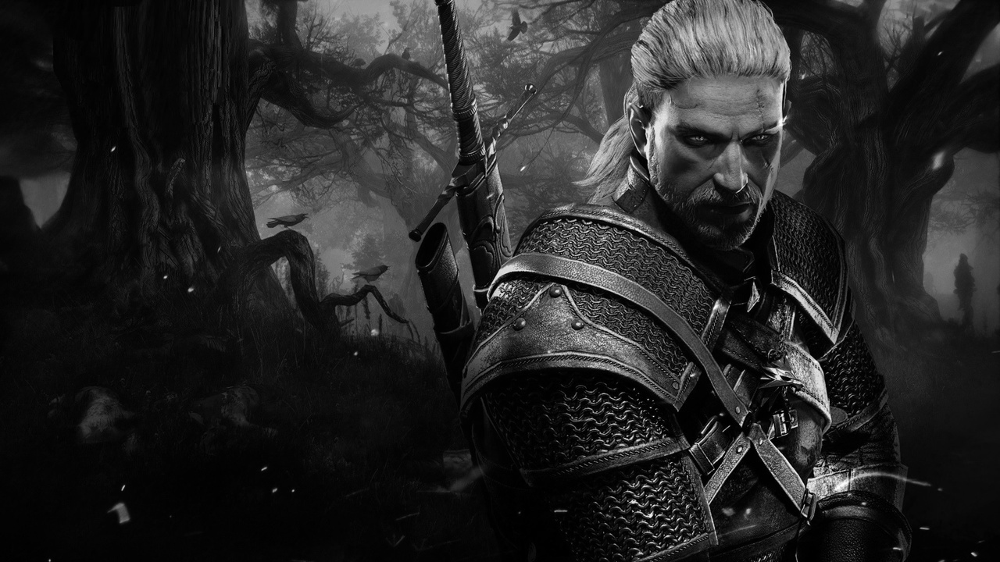

Зашумленное изображение


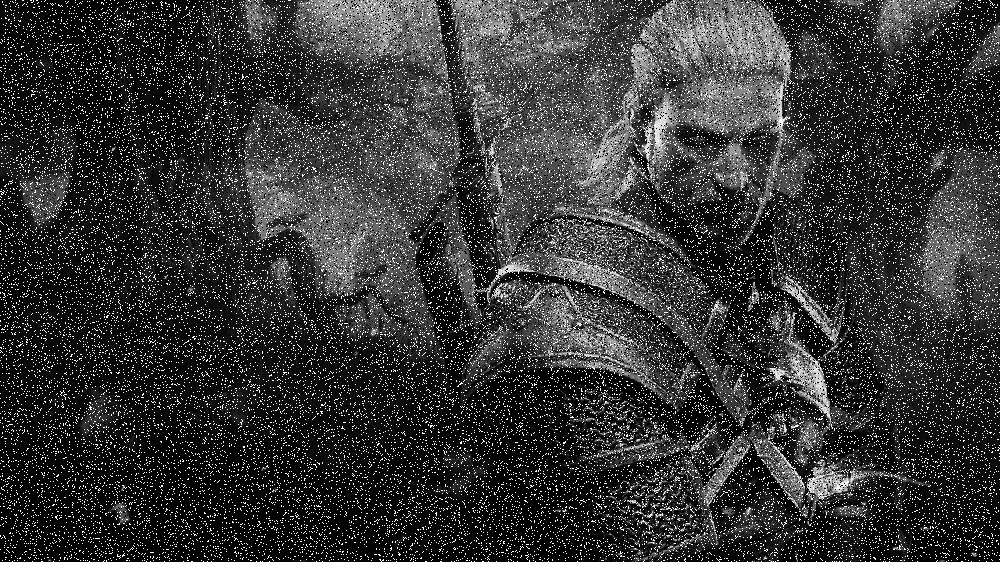

CPU очистка изображения


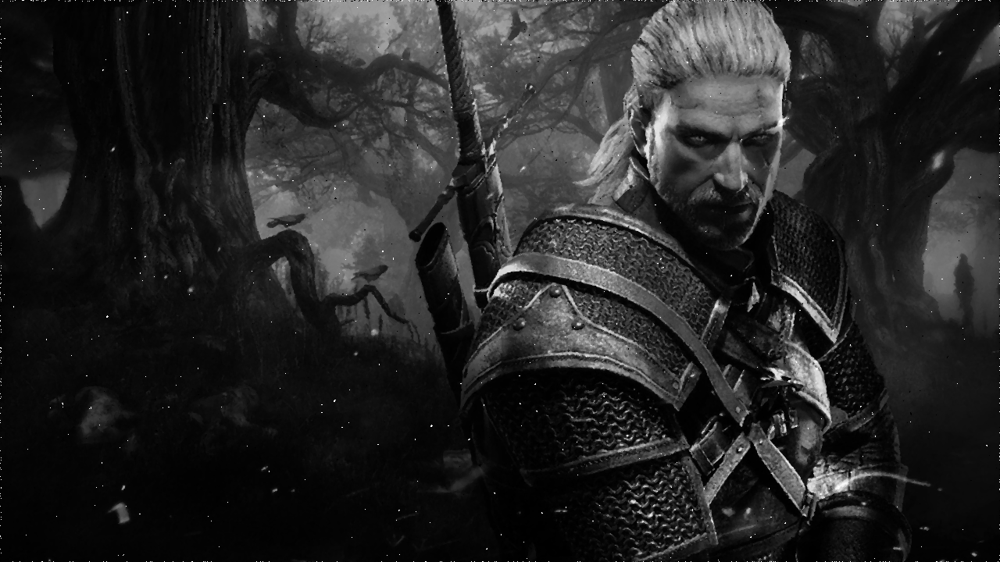

GPU очистка изображения


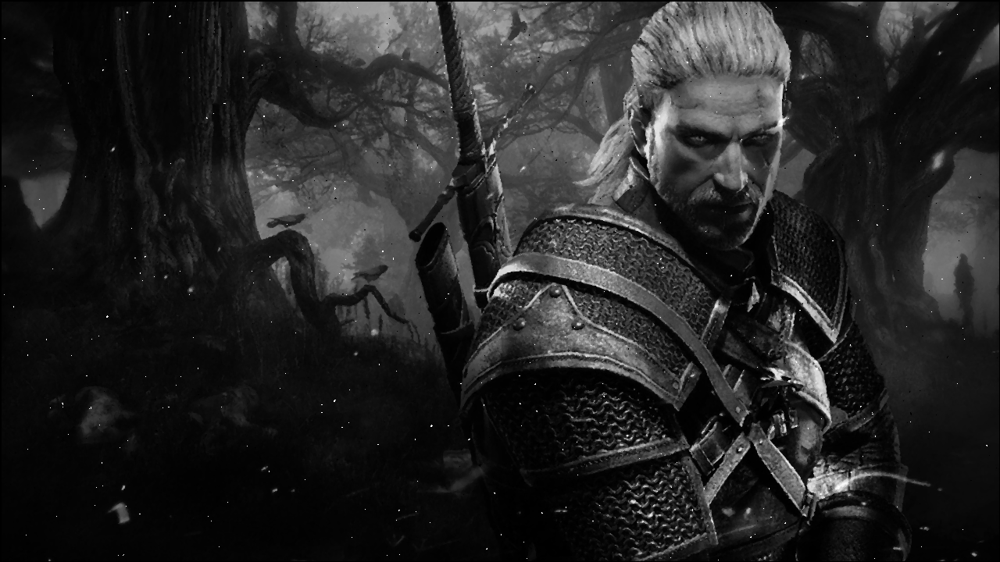

Время на CPU = 24.46807551383972
Время на GPU = 0.0018422603607177734
Ускорение = 13281.551313575774

Исходное изображение


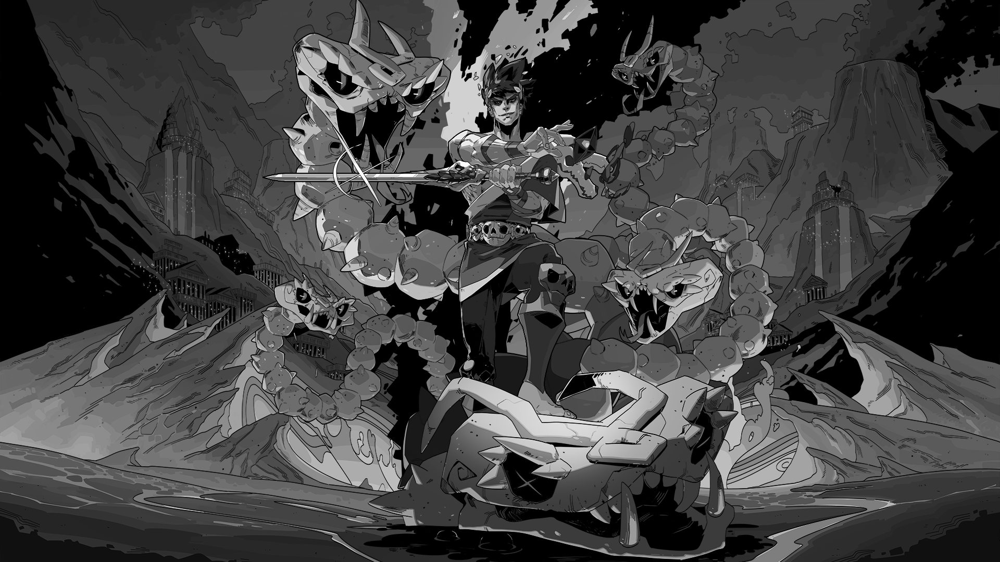

Зашумленное изображение


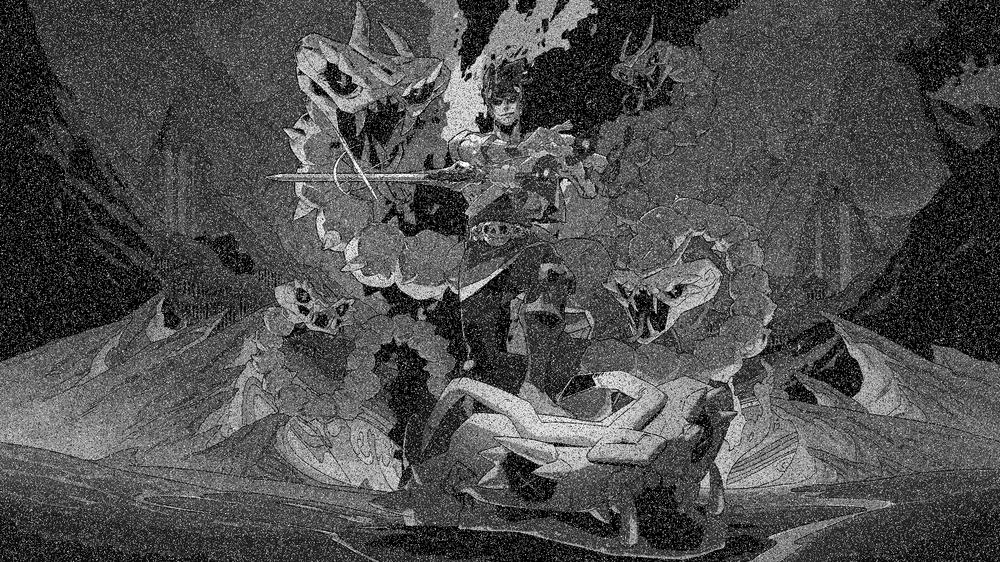

CPU очистка изображения


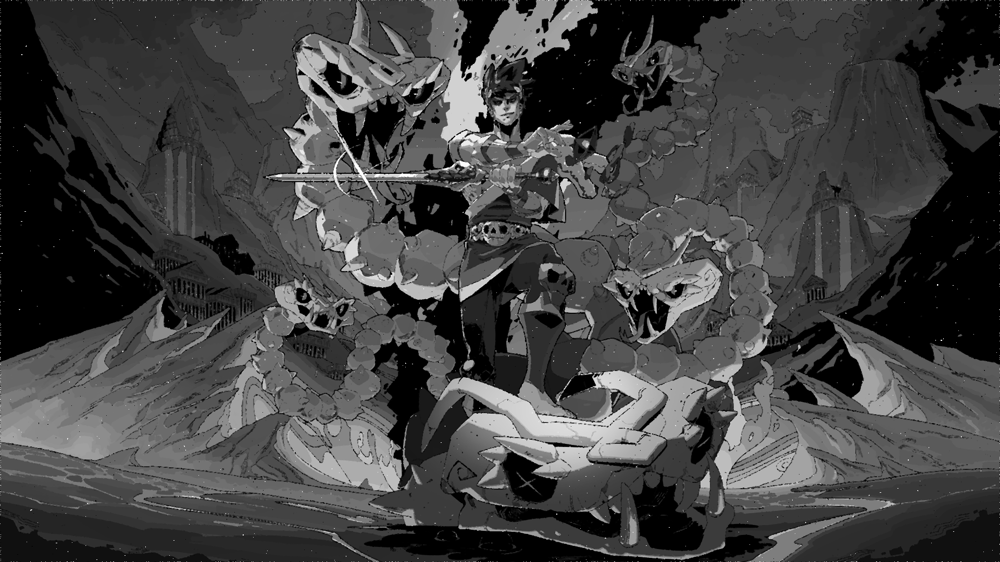

GPU очистка изображения


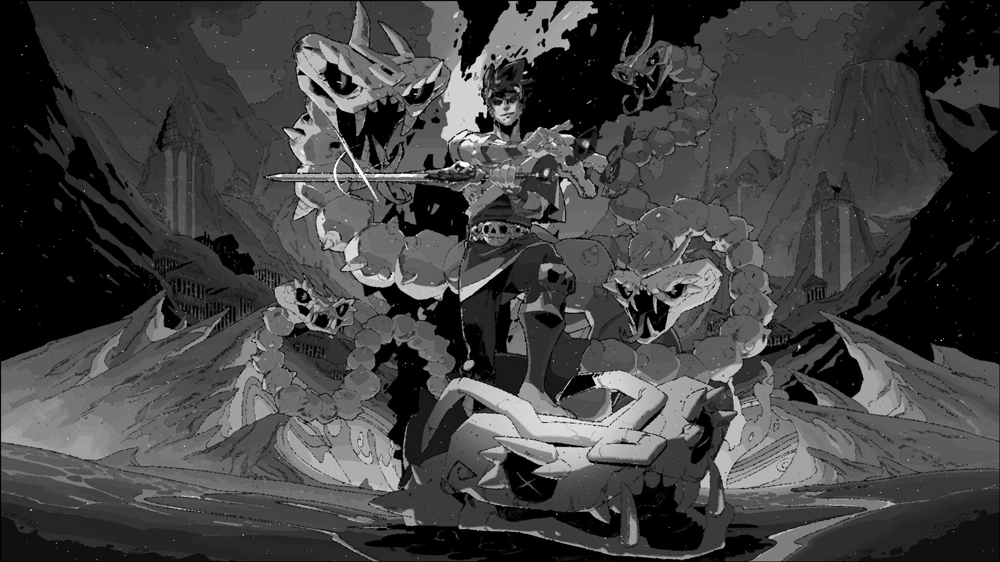

Время на CPU = 51.52814865112305
Время на GPU = 0.005786895751953125
Ускорение = 8904.28147659855

Исходное изображение


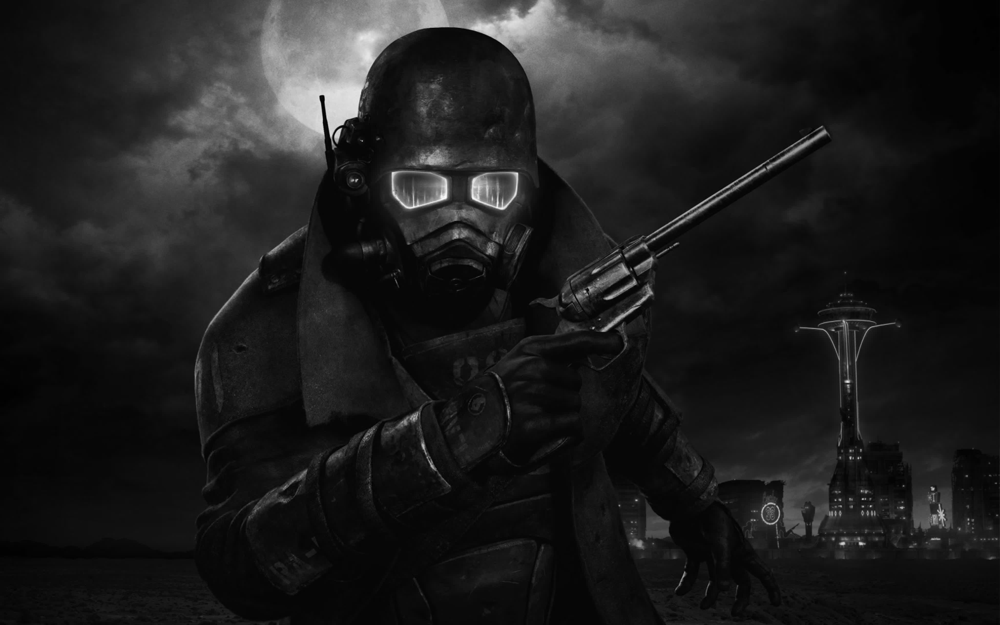

Зашумленное изображение


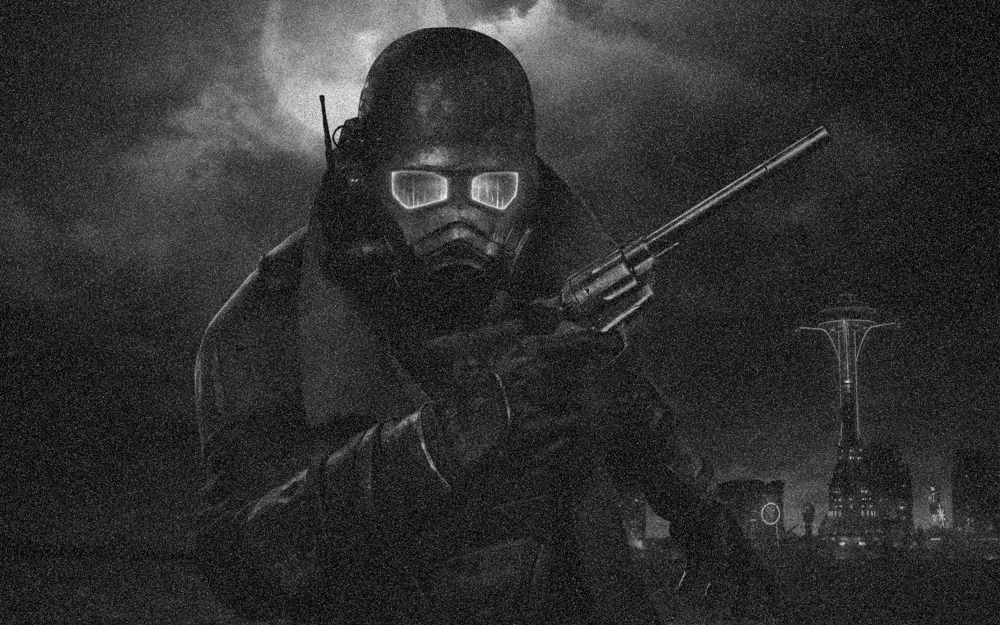

CPU очистка изображения


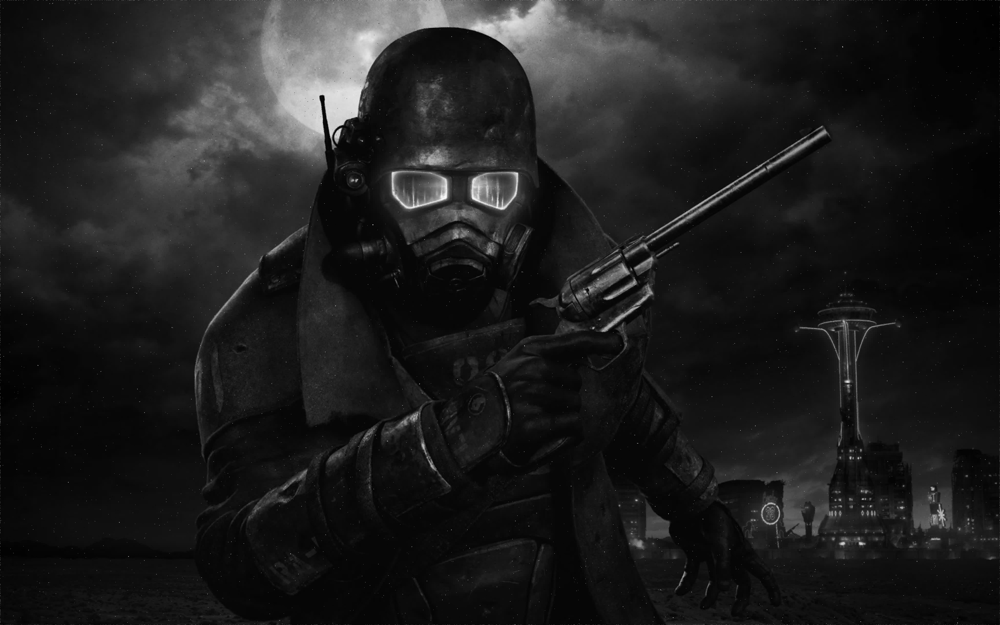

GPU очистка изображения


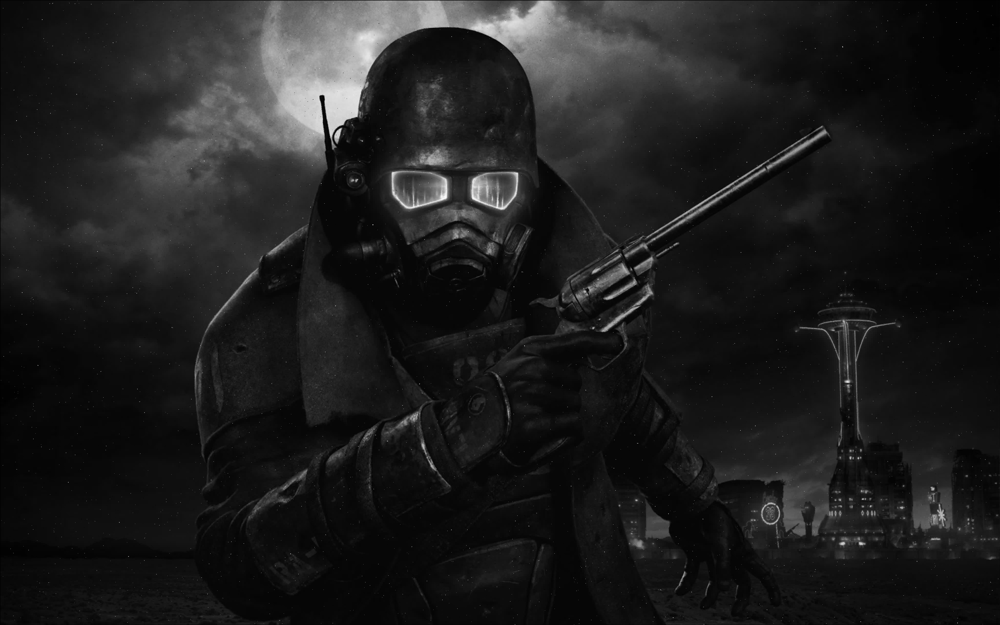

Время на CPU = 264.6055209636688
Время на GPU = 0.03621172904968262
Ускорение = 7307.177202188526

Исходное изображение


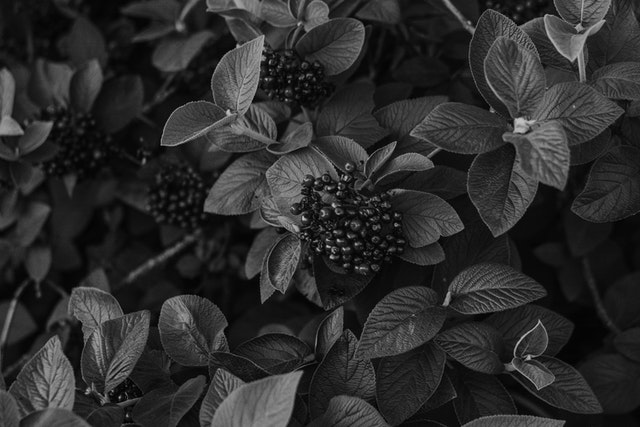

Зашумленное изображение


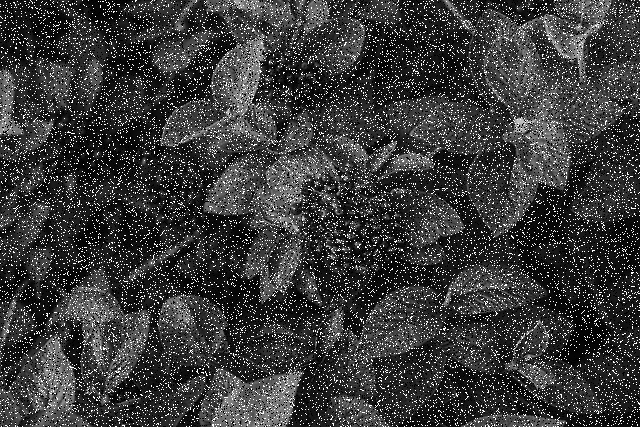

CPU очистка изображения


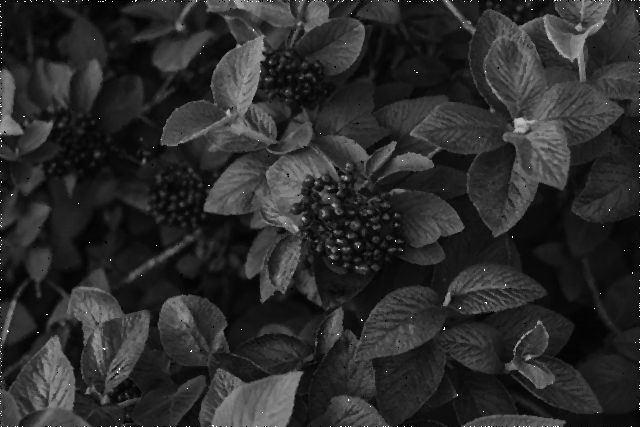

GPU очистка изображения


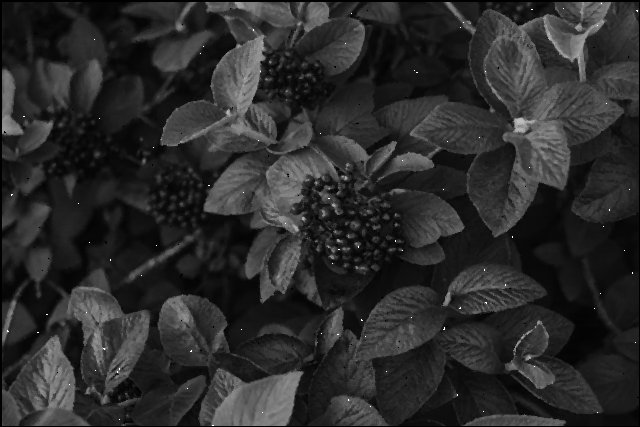

Время на CPU = 9.959061622619629
Время на GPU = 0.0008881092071533203
Ускорение = 11213.780402684564



In [11]:
a1 = experiment(image0, True)
a2 = experiment(image1, True)
a3 = experiment(image2, True)
a4 = experiment(image3, True)